# HEART DISEASE PREDICTION
---
### Supervised Machine Learning: Classification

Author: Federico Gorrini, Ph.D.

Data and Machine Learning models:
- Supervised data: This type of data always includes one or more target variables.
- Unsupervised data: This type of data does not include any target variables.

Tackling a supervised problem is generally more straightforward compared to an unsupervised one. A supervised problem involves predicting a specific value. For instance, predicting house prices based on historical data and features such as proximity to hospitals, schools, supermarkets, and public transport is a supervised problem. Similarly, if we have images of cats and dogs, and we know which images correspond to each animal, creating a model to predict whether a given image is of a cat or a dog is also a supervised problem.

In this dataset, we are dealing with a supervised machine learning problem aimed at predicting heart failure.

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

# CARDIOVASCULAR DISEASES 

<!-- <img src="https://media.giphy.com/media/8cBhJBU2wlq6H6qY4W/giphy.gif"> -->

Cardiovascular diseases (CVDs) are a group of disorders affecting the heart and blood vessels, and they are the leading cause of death globally. In 2019, an estimated 17.9 million people died from CVDs, accounting for 32% of all global deaths1. Of these deaths, 85% were due to heart attacks and strokes.

Tracking and predicting CVDs is crucial because early detection and management can significantly reduce the risk of severe complications and death. Over three-quarters of CVD deaths occur in low- and middle-income countries, highlighting the need for accessible healthcare and preventive measures. Additionally, in the United States, heart disease is the leading cause of death, with one person dying every 33 seconds from cardiovascular disease.
By addressing behavioral and environmental risk factors such as tobacco use, unhealthy diet, physical inactivity, and air pollution, many cardiovascular diseases can be prevented1. Therefore, monitoring these risk factors and implementing effective health policies are essential steps towards reducing the global burden of CVDs.

Preventing CVDs involves addressing the risk factors through lifestyle changes such as:
Healthy Eating: Consuming a balanced diet rich in fruits, vegetables, and whole grains.
Regular Physical Activity: Engaging in at least 150 minutes of moderate-intensity exercise per week.
Avoiding Tobacco: Quitting smoking and avoiding secondhand smoke.
Limiting Alcohol: Reducing alcohol intake to moderate levels.

Early detection and management are crucial. Regular health check-ups can help monitor blood pressure, cholesterol levels, and other indicators of heart health. Medications and medical procedures may also be necessary to manage existing conditions.
By understanding and addressing the risk factors and symptoms of CVDs, we can significantly reduce the global burden of these diseases and improve overall heart health.


# HEARTH FAILURE

Heart failure, also known as congestive heart failure, is a chronic condition where the heart muscle is unable to pump blood efficiently enough to meet the body's needs. This can lead to a build-up of fluid in the lungs and other parts of the body, causing symptoms such as shortness of breath, fatigue, and swelling in the legs and ankles.

**Causes of Heart Failure**
Heart failure can result from various conditions that damage or overwork the heart, including:
Coronary Artery Disease (CAD): Narrowed or blocked arteries reduce blood flow to the heart muscle.
Heart Attack: A sudden blockage of blood flow to the heart muscle, causing permanent damage.
High Blood Pressure: Forces the heart to work harder than normal, leading to thickening or stiffening of the heart muscle.
Cardiomyopathy: Diseases of the heart muscle due to genetic factors, infections, or alcohol/drug abuse.
Heart Valve Problems: Faulty heart valves force the heart to work harder to pump blood.

**Symptoms of Heart Failure**

Shortness of Breath: Especially during physical activity or when lying down.
Fatigue and Weakness: Due to reduced blood flow to muscles and organs.
Swelling (Edema): In the legs, ankles, and feet due to fluid retention.
Rapid or Irregular Heartbeat: As the heart tries to compensate for its reduced pumping ability.
Persistent Cough or Wheezing: Due to fluid build-up in the lungs.

**Diagnosis and Treatment**
Diagnosing heart failure typically involves a combination of physical exams, imaging tests (such as echocardiograms and MRIs), and blood tests to assess heart function and identify underlying causes. Treatment aims to manage symptoms and improve quality of life. It may include:
Medications: Such as ACE inhibitors, beta-blockers, and diuretics to reduce symptoms and prevent further damage.
Lifestyle Changes: Including a heart-healthy diet, regular exercise, quitting smoking, and limiting alcohol intake.
Surgical Procedures: In severe cases, procedures like coronary artery bypass grafting (CABG), heart valve repair/replacement, or heart transplant may be necessary.

**Prevention**
Preventing heart failure involves managing risk factors through:
Regular Health Check-ups: Monitoring blood pressure, cholesterol levels, and other heart health indicators.
Healthy Lifestyle Choices: Maintaining a balanced diet, staying physically active, and avoiding tobacco and excessive alcohol.

### Read Dataset

In [2]:
URL = 'heart_failure_clinical_records_dataset_14_columns.csv'
df = pd.read_csv(URL)

# Dataset has 11 features (numerical and categorical) and 1 Target (categorical), which is the presence of a heart disease.
df.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [3]:
# Description of numerical features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,303.0,54.366337,9.082101,29.0,47.5,55.0,61.0,77.0
sex,303.0,0.683168,0.466011,0.0,0.0,1.0,1.0,1.0
cp,303.0,0.966997,1.032052,0.0,0.0,1.0,2.0,3.0
trtbps,303.0,131.623762,17.538143,94.0,120.0,130.0,140.0,200.0
chol,303.0,246.264026,51.830751,126.0,211.0,240.0,274.5,564.0
fbs,303.0,0.148515,0.356198,0.0,0.0,0.0,0.0,1.0
restecg,303.0,0.528053,0.525860,0.0,0.0,1.0,1.0,2.0
thalachh,303.0,149.646865,22.905161,71.0,133.5,153.0,166.0,202.0
exng,303.0,0.326733,0.469794,0.0,0.0,0.0,1.0,1.0
oldpeak,303.0,1.039604,1.161075,0.0,0.0,0.8,1.6,6.2


In [4]:
df.shape

(303, 14)

In [5]:
df

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0


### DATA SET FEATURES

- **age**: The age of the patient in years.

- **sex**: The gender of the patient (1 = male, 0 = female).

- **cp** (chest pain type): The type of chest pain experienced by the patient:
0: Typical angina
1: Atypical angina
2: Non-anginal pain
3: Asymptomatic

- **trtbps** (resting blood pressure): The patient’s resting blood pressure in mm Hg.

- **chol** (cholesterol): The patient’s serum cholesterol level in mg/dl.

- **fbs** (fasting blood sugar): Whether the patient’s fasting blood sugar is greater than 120 mg/dl (1 = true, 0 = false).

- **restecg** (resting electrocardiographic results): The results of the patient’s resting electrocardiogram:
0: Normal
1: Having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)
2: Showing probable or definite left ventricular hypertrophy by Estes’ criteria

- **thalachh** (maximum heart rate achieved): The maximum heart rate achieved by the patient during exercise.

- **exng** (exercise-induced angina): Whether the patient experienced angina induced by exercise (1 = yes, 0 = no).

- **oldpeak**: ST depression induced by exercise relative to rest.

- **slp** (slope of the peak exercise ST segment): The slope of the peak exercise ST segment:
0: Upsloping
1: Flat
2: Downsloping

- **caa** (number of major vessels colored by fluoroscopy): The number of major vessels (0-3) colored by fluoroscopy.

- **thall** (thalassemia): A blood disorder involving less than normal amounts of an oxygen-carrying protein:
0: Null
1: Fixed defect (no blood flow in some part of the heart)
2: Normal blood flow
3: Reversible defect (a blood flow is observed but it is not normal)

- **heart failure**: The target variable indicating whether the patient has heart failure (1 = yes, 0 = no).

In [6]:
# Dataset has 13 features (numerical and categorical) and 1 Target (categorical).
df.dtypes

age           int64
sex           int64
cp            int64
trtbps        int64
chol          int64
fbs           int64
restecg       int64
thalachh      int64
exng          int64
oldpeak     float64
slp           int64
caa           int64
thall         int64
output        int64
dtype: object

### Data Information

In [7]:
# Display the first few rows of the dataframe
display(df.head(10))

print(30 * "-", "COLUMNS", 30 * "-")
print(df.columns, "\n", 30 * "-","INFO",30 * "-")

display(df.info())

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1,1
6,56,0,1,140,294,0,0,153,0,1.3,1,0,2,1
7,44,1,1,120,263,0,1,173,0,0.0,2,0,3,1
8,52,1,2,172,199,1,1,162,0,0.5,2,0,3,1
9,57,1,2,150,168,0,1,174,0,1.6,2,0,2,1


------------------------------ COLUMNS ------------------------------
Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall', 'output'],
      dtype='object') 
 ------------------------------ INFO ------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output   

None

### Missing & Duplicate Values

In [8]:
# Check for missing & dublicate values
print(f"number of null values: {df.isnull().sum().sum()}")
print(f"number of dublicate values: {df.duplicated().sum()}")

number of null values: 0
number of dublicate values: 1


The string type data in the dataframe is in the form of object. It needs to be converted back to a string type to work on it.

In [9]:
string_col = df.select_dtypes(include = "object").columns
df[string_col] = df[string_col].astype("string")

In [10]:
df.dtypes

age           int64
sex           int64
cp            int64
trtbps        int64
chol          int64
fbs           int64
restecg       int64
thalachh      int64
exng          int64
oldpeak     float64
slp           int64
caa           int64
thall         int64
output        int64
dtype: object

In [11]:
df.shape

(303, 14)

# FEATURES
| **Feature**       | **Description**                                                                                   |
|-------------------|---------------------------------------------------------------------------------------------------|
| **age**           | The age of the patient in years. |
| **sex**           | The gender of the patient (1 = male, 0 = female). |
| **cp**            | The type of chest pain experienced by the patient: 0: Typical angina; 1: Atypical angina; 2: Non-anginal pain; 3: Asymptomatic. |
| **trtbps**        | The patient’s resting blood pressure in mm Hg. |
| **chol**          | The patient’s serum cholesterol level in mg/dl. |
| **fbs**           | Whether the patient’s fasting blood sugar is greater than 120 mg/dl (1 = true, 0 = false).        |
| **restecg**       | The results of the patient’s resting electrocardiogram: 0: Normal; 1: Having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)|; 2: Showing probable or definite left ventricular hypertrophy by Estes’ criteria |
| **thalachh**      | The maximum heart rate achieved by the patient during exercise. |
| **exng**          | Whether the patient experienced angina induced by exercise (1 = yes, 0 = no). |
| **oldpeak**       | ST depression induced by exercise relative to rest. |
| **slp**           | The slope of the peak exercise ST segment: 0: Upsloping; 1: Flat; 2: Downsloping |
| **caa**           | The number of major vessels (0-3) colored by fluoroscopy. |
| **thall**         | A blood disorder involving less than normal amounts of an oxygen-carrying protein: 0: Null; 1: Fixed defect (no blood flow in some part of the heart); 2: Normal blood flow; 3: Reversible defect (a blood flow is observed but it is not normal) |


# TARGET
| Feature         | Description                                                                 |
|-----------------|-----------------------------------------------------------------------------|
| output    | output class [1: heart disease, 0: Normal] |

# EXPLORATORY DATA ANALYSIS (EDA)
- Gaining a comprehensive understanding of the dataset and assisting in its cleanup.
- Providing a clear view of the features and their interrelationships.
- Offering guidelines for identifying essential variables and discarding non-essential ones.
- Addressing missing values or human errors.
- Detecting outliers.
- Maximizing insights from the dataset through the EDA process.
- Although time-consuming, this process is highly effective.

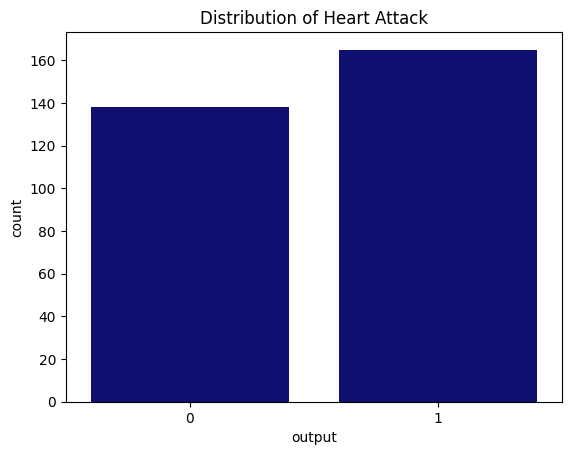

In [12]:
# Explore the distribution of the target variable
sns.countplot(data = df, x = 'output', color = 'navy')
plt.title('Distribution of Heart Attack')
plt.show()

## Correlation Matrix
Removing correlated variables is crucial for enhancing the model’s performance. Correlations can be identified using the pandas .corr() function and visualize the correlation matrix.
- Lighter shades indicate a lower absolute correlation.
- Darker shades indicate a higher absolute correlation.

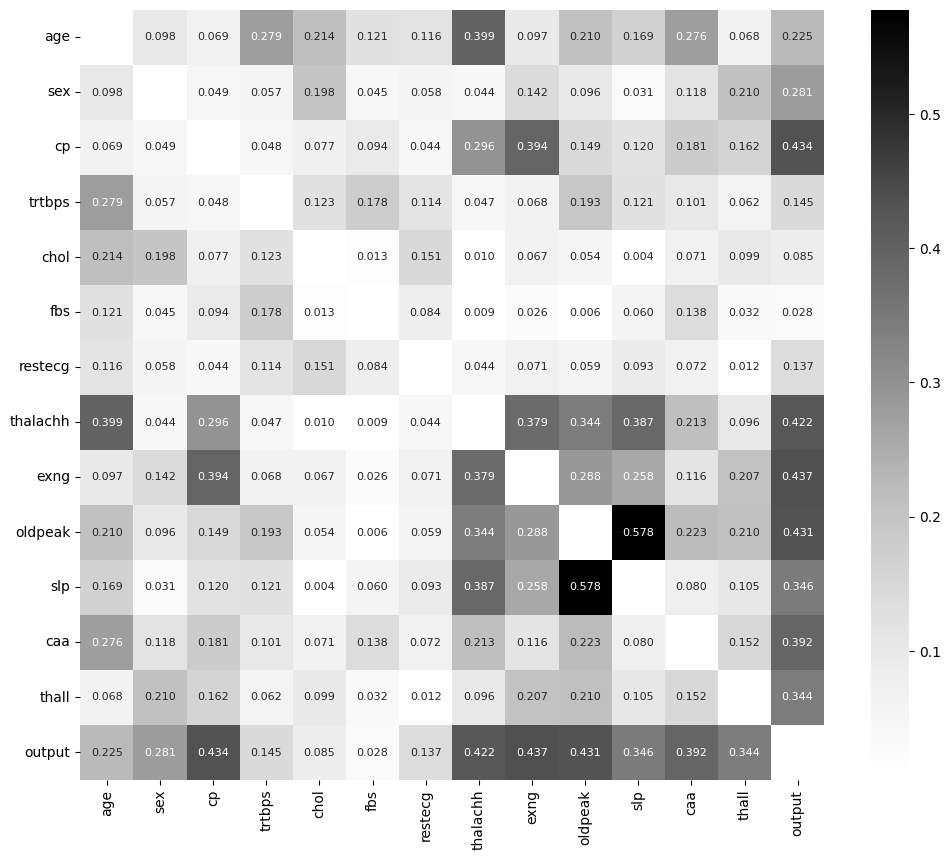

In [13]:
# Select only numeric columns
# Remove categorical features and keep numerical features only for correlation coefficients analysis.
# When creating a correlation coefficients plot, it is generally more meaningful to correlate only the numerical features. Correlation coefficients measure the linear relationship between two continuous variables, so applying them to categorical features does not provide useful information.
numeric_df = df.select_dtypes(include = [float, int])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Set the figure size
plt.figure(figsize = (12, 10))

# Set the diagonal values to NaN
np.fill_diagonal(corr_matrix.values, np.nan)

# Create the heatmap with correlation values annotated and font size set to 10
sns.heatmap(abs(corr_matrix), annot = True, fmt = ".3f", cmap = "Greys", annot_kws = {"size": 8})

# Add the title
# plt.title("\n Correlation Plot of the Heart Failure Prediction \n")

# Display the plot
plt.show()

In [14]:
# Distribution of Heat Diseases with respect to male and female
import plotly.express as px

# Assuming df is your DataFrame
fig = px.histogram( df, 
                    x = "output",
                    color = "sex",
                    hover_data = df.columns,
                    title = "Distribution of Heart Diseases",
                    barmode = "group",
                    color_discrete_sequence = ["navy", "#EB0A1E"])  # Pastel Rose and Pastel Blue color codes

# Update the layout and margins to set the plot
fig.update_layout(  plot_bgcolor = 'white', width = 800, height = 600,
                    margin = dict(l = 20, r = 20, t = 40, b = 20))  # Adjust margins to make the plot tighter

fig.show()

In [15]:
import plotly.express as px

# Assuming df is your DataFrame
fig = px.histogram( df,
                    x = "sex",
                    hover_data = df.columns,
                    title = "Sex Ratio in the Data",
                    color_discrete_sequence = ["navy", "red"])

# Update the layout and margins to set the plot
fig.update_layout(  plot_bgcolor = 'white', width = 800, height = 600,
                    margin = dict(l = 20, r = 20, t = 40, b = 20), 
                    bargap = 0.2)

fig.show()

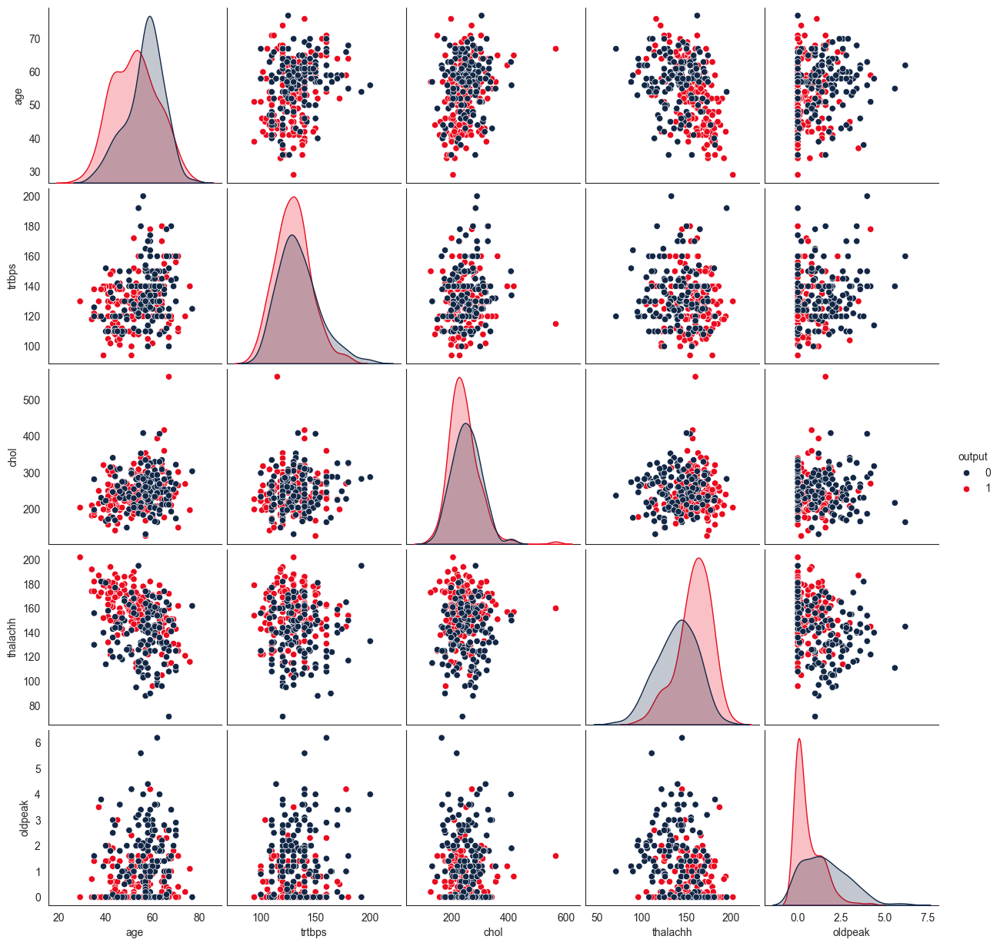

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the background to white
sns.set_style("white")

# Define the color palette
palette = ["#122746", "#EB0A1E"]
# palette = ["navy", "red"]

# plt.figure(figsize = (15, 10))

# Identify categorical features, excluding target feature 'output'
binary_features = df.columns[(df.nunique() <= 5) | (df.isin([0, 1]).all())]
binary_features = binary_features.drop('output')
# Remove categorical features from the DataFrame, except 'output'
df_filtered = df.drop(columns = binary_features)

# Remove instances where the value is 0 for the remaining numerical features, excluding 'output'
# null_instances = df_filtered.drop(columns = ['output'])
# df_filtered = df_filtered[(null_instances != 0).all(axis = 1)]



# Create the pair plot
sns.pairplot(df_filtered, hue = "output", palette = palette)

# plt.tight_layout()

plt.show()

# DATA SKEWNESS
To assess the linearity of the variables, it is advisable to plot distribution graphs and examine the skewness of the features. The Kernel Density Estimate (KDE) is a particularly effective tool for visualizing the shape of a distribution.

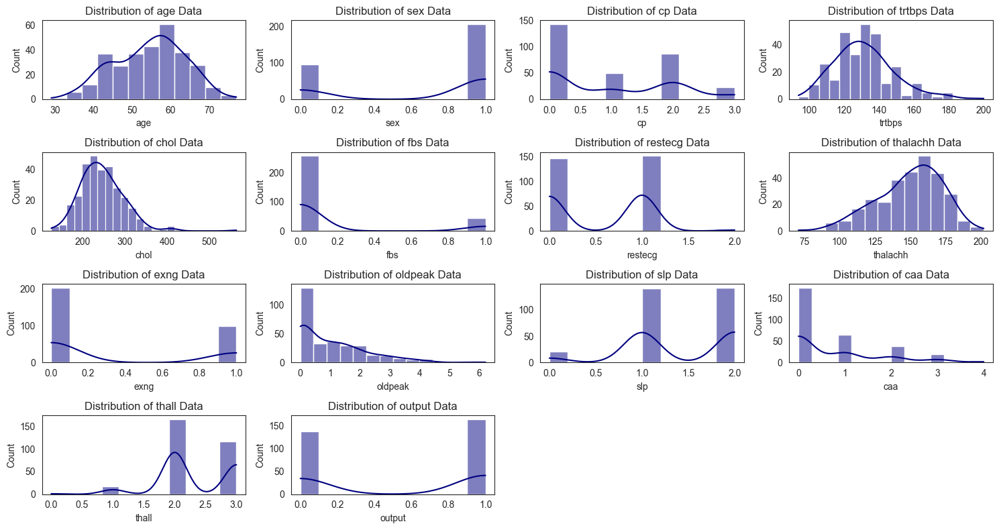

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize = (15, 8))

for i, col in enumerate(df.columns, 1):
    plt.subplot(4, 4, i)
    plt.title(f"Distribution of {col} Data")
    sns.histplot(df[col], kde = True, color = 'navy')
    plt.tight_layout()

plt.show()


# DATA - BOXPLOT (OUTLIERS)
A box plot, also known as a box-and-whisker plot, illustrates the distribution of quantitative data, facilitating comparisons between variables. The box represents the quartiles of the dataset, while the whiskers extend to depict the remainder of the distribution. This standardized method of displaying data distribution is based on the five-number summary:
- Minimum
- First quartile
- Median
- Third quartile
- Maximum
In its simplest form, the central rectangle of the box plot spans from the first quartile to the third quartile, representing the interquartile range (IQR). A line within the rectangle indicates the median, and the “whiskers” above and below the box denote the positions of the minimum and maximum values.

In [18]:
# Distribution of Age

import plotly.express as px

# Assuming df is your DataFrame
fig = px.box(   df, 
                y = "age", 
                x = "output", 
                title = "Distribution of Age",
                color_discrete_sequence = ["navy"])

# Update the layout and margins to set the plot
fig.update_layout(  plot_bgcolor = 'white', width = 800, height = 600,
                    margin = dict(l = 20, r = 20, t = 40, b = 20))

fig.show()

In [19]:
# Distribution of cholesterol

import plotly.express as px

# Assuming df is your DataFrame
fig = px.box(   df, 
                y = "chol", 
                x = "output", 
                title = "Distribution of Cholesterol",
                color_discrete_sequence = ["navy"])

# Update the layout and margins to set the plot
fig.update_layout(  plot_bgcolor = 'white', width = 800, height = 600,
                    margin = dict(l = 20, r = 20, t = 40, b = 20))

fig.show()

In [20]:
# Distribution of ST Depression

import plotly.express as px

# Assuming df is your DataFrame
fig = px.box(   df, 
                y = "oldpeak", 
                x = "output", 
                title = "Distribution of ST Depression",
                color_discrete_sequence = ["navy"])

# Update the layout and margins to set the plot
fig.update_layout(  plot_bgcolor = 'white', width = 800, height = 600,
                    margin = dict(l = 20, r = 20, t = 40, b = 20))

fig.show()

In [21]:
# Distribution of Bloodpressure

import plotly.express as px

# Assuming df is your DataFrame
fig = px.box(   df, 
                y = "trtbps", 
                x = "output", 
                title = "Distribution of Bloodpressure",
                color_discrete_sequence = ["navy"])

# Update the layout and margins to set the plot
fig.update_layout(  plot_bgcolor = 'white', width = 800, height = 600,
                    margin = dict(l = 20, r = 20, t = 40, b = 20))

fig.show()

In [22]:
# Distribution of Maximum Heart Rate

import plotly.express as px

# Assuming df is your DataFrame
fig = px.box(   df, 
                y = "trtbps", 
                x = "output", 
                title = "Distribution of Maximum Heart Rate",
                color_discrete_sequence = ["navy"])

# Update the layout and margins to set the plot
fig.update_layout(  plot_bgcolor = 'white', width = 800, height = 600,
                    margin = dict(l = 20, r = 20, t = 40, b = 20))

fig.show()

# Data Preprocessing
Data preprocessing is an integral step in Machine Learning as the quality of data and the useful information that can be derived from it directly affects the ability of our model to learn; therefore, it is extremely important that we preprocess our data before feeding it into our model.

The concepts that I will cover in this article are
1. Handling Null Values
2. Feature Scaling
3. Handling Categorical Variables

### Handling Null Values:
In python, NULL is reprsented with NaN. So don’t get confused between these two,they can be used interchangably.

In [23]:
# Checking for Type of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [24]:
# Checking for NULL data in the data set
df.isnull().sum()

age         0
sex         0
cp          0
trtbps      0
chol        0
fbs         0
restecg     0
thalachh    0
exng        0
oldpeak     0
slp         0
caa         0
thall       0
output      0
dtype: int64

### Handling Missing Values in Datasets

When dealing with datasets, it is crucial to address the presence of missing values. Simply removing rows or columns with missing values is not always the best approach, as it can lead to significant information loss. In real-world datasets, it is common to encounter a large number of missing values for certain fields. Therefore, instead of discarding these values, it is often more effective to find a way to substitute them.

### Imputation

Imputation is the process of substituting the missing values in a dataset. This can be done by defining a custom function or by using tools such as the SimpleImputer class provided by sklearn. Imputation helps maintain the integrity of the dataset by filling in the gaps, allowing for more accurate analysis and modeling.

# 2. Feature Scaling

The first question we need to address is: why do we need to scale the variables in our dataset? Some machine learning algorithms are sensitive to feature scaling, while others are virtually invariant to it. Let's delve into this in more detail.

### Distance-Based Algorithms

Distance algorithms such as **KNN**, **K-means**, and **SVM** are significantly affected by the range of features. This is because they rely on the distances between data points to determine their similarity. When two features have different scales, there is a risk that features with higher magnitudes will be given more weight. This can negatively impact the performance of the machine learning algorithm, leading to bias towards one feature.

To prevent this, we scale our data before using a distance-based algorithm, ensuring that all features contribute equally to the result.

### Tree-Based Algorithms

Tree-based algorithms, on the other hand, are relatively insensitive to the scale of the features. Consider a decision tree: it splits a node based on a single feature, aiming to increase the homogeneity of the node. This split is not influenced by the scale of other features.

As a result, the remaining features have virtually no effect on the split, making tree-based algorithms invariant to the scale of the features.

### Normalization

Normalization is a technique used to adjust and rescale values so that they fall within the range of 0 to 1. This method is also referred to as Min-Max scaling. In this context, \( X_{\text{max}} \) and \( X_{\text{min}} \) denote the maximum and minimum values of the feature, respectively.

When \( X \) is the minimum value in the column, the numerator becomes 0, resulting in \( X' \) being 0. Conversely, when \( X \) is the maximum value in the column, the numerator equals the denominator, making \( X' \) equal to 1. If \( X \) lies between the minimum and maximum values, then \( X' \) will be between 0 and 1.

### Standardization

Standardization is another scaling technique where values are centered around the mean with a unit standard deviation. This implies that the mean of the attribute becomes zero, and the resultant distribution has a unit standard deviation.

### Question – Normalize or Standardize?

The debate between normalization and standardization is a common one among machine learning practitioners. Here is a detailed explanation:

- **Normalization** is recommended when the distribution of your data does not follow a Gaussian distribution. This can be particularly useful in algorithms that do not assume any distribution of the data, such as K-Nearest Neighbors and Neural Networks.

- **Standardization**, on the other hand, is beneficial when the data follows a Gaussian distribution. However, this is not a strict requirement. Unlike normalization, standardization does not have a bounding range. Therefore, even if outliers are present in your data, they will not be affected by standardization.

Ultimately, the choice between normalization and standardization depends on the specific problem and the machine learning algorithm being used. There is no definitive rule dictating when to normalize or standardize your data.

### Robust Scaler

When dealing with outliers, Robust Scaling can be employed to scale the data. This method scales features using statistics that are robust to outliers. It removes the median and scales the data within the range between the 1st quartile and the 3rd quartile, also known as the Interquartile Range (IQR). The median and the IQR are then stored for future data transformation using the transform method. If outliers are present in the dataset, the median and the IQR provide better results and outperform the sample mean and variance. RobustScaler utilizes the IQR to ensure robustness against outliers.


# 3. Handling Categorical Variables

Categorical variables/features are any feature type can be classified into two major types:
- Nominal
- Ordinal

Nominal variables are variables that have two or more categories which do not have any kind of order associated with them. For example, if gender is classified into two groups, i.e. male and female, it can be considered as a nominal variable.Ordinal variables, on the other hand, have “levels” or categories with a particular order associated with them. For example, an ordinal categorical variable can be a feature with three different levels: low, medium and high. Order is important.

It is a binary classification problem:
the target here is **not skewed** but we use the best metric for this binary classification problem which would be Area Under the ROC Curve (AUC). We can use precision and recall too, but AUC combines these two metrics. Thus, we will be using AUC to evaluate the model that we build on this dataset.

We have to know that computers do not understand text data and thus, we need to convert these categories to numbers. A simple way of doing that can be to use :
- Label Encoding
```python
from sklearn.preprocessing import LabelEncoder
```
- One Hot Encoding
```python
pd.get_dummies()
```

but we need to understand where to use which type of label encoding:

**For not Tree based Machine Learning Algorithms the best way to go will be to use One-Hot Encoding**
- One-Hot-Encoding has the advantage that the result is binary rather than ordinal and that everything sits in an orthogonal vector space. 
- The disadvantage is that for high cardinality, the feature space can really blow up quickly and you start fighting with the curse of dimensionality. In these cases, I typically employ one-hot-encoding followed by PCA for dimensionality reduction. I find that the judicious combination of one-hot plus PCA can seldom be beat by other encoding schemes. PCA finds the linear overlap, so will naturally tend to group similar features into the same feature

**For Tree based Machine Learning Algorithms the best way to go is with Label Encoding**

- LabelEncoder can turn [dog,cat,dog,mouse,cat] into [1,2,1,3,2], but then the imposed ordinality means that the average of dog and mouse is cat. Still there are algorithms like decision trees and random forests that can work with categorical variables just fine and LabelEncoder can be used to store values using less disk space.

In [25]:
# Convert 'object' type to 'string'
string_col = df.select_dtypes(include = "object").columns
df[string_col] = df[string_col].astype("string")

# Getting the categorical columns 
string_col = df.select_dtypes("string").columns.to_list()

df[string_col].head()

for col in string_col:
    print(f"Distribution of categorical values in the {col}: ")
    print(df[col].value_counts())

In [26]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,303.0,54.366337,9.082101,29.0,47.5,55.0,61.0,77.0
sex,303.0,0.683168,0.466011,0.0,0.0,1.0,1.0,1.0
cp,303.0,0.966997,1.032052,0.0,0.0,1.0,2.0,3.0
trtbps,303.0,131.623762,17.538143,94.0,120.0,130.0,140.0,200.0
chol,303.0,246.264026,51.830751,126.0,211.0,240.0,274.5,564.0
fbs,303.0,0.148515,0.356198,0.0,0.0,0.0,0.0,1.0
restecg,303.0,0.528053,0.525860,0.0,0.0,1.0,1.0,2.0
thalachh,303.0,149.646865,22.905161,71.0,133.5,153.0,166.0,202.0
exng,303.0,0.326733,0.469794,0.0,0.0,0.0,1.0,1.0
oldpeak,303.0,1.039604,1.161075,0.0,0.0,0.8,1.6,6.2


# FEATURES
| Feature         | Description                                                                 |
|-----------------|-----------------------------------------------------------------------------|
| Age             | age of the patient [years]                                                  |
| Sex             | sex of the patient [M: Male, F: Female]                                     |
| ChestPainType   | chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic] |
| RestingBP       | resting blood pressure [mm Hg]                                              |
| Cholesterol     | serum cholesterol [mm/dl]                                                   |
| FastingBS       | fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]             |
| RestingECG      | resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria] |
| MaxHR           | maximum heart rate achieved [Numeric value between 60 and 202]              |
| ExerciseAngina  | exercise-induced angina [Y: Yes, N: No]                                     |
| Oldpeak         | oldpeak = ST [Numeric value measured in depression]                         |
| ST_Slope        | the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping] |

# TARGET
| Feature         | Description                                                                 |
|-----------------|-----------------------------------------------------------------------------|
| HeartDisease    | output class [1: heart disease, 0: Normal]                                  |

# EXPLORATORY DATA ANALYSIS (EDA)
- Gaining a comprehensive understanding of the dataset and assisting in its cleanup.
- Providing a clear view of the features and their interrelationships.
- Offering guidelines for identifying essential variables and discarding non-essential ones.
- Addressing missing values or human errors.
- Detecting outliers.
- Maximizing insights from the dataset through the EDA process.
- Although time-consuming, this process is highly effective.

#  MODEL BUILDING

# Cross-Validation Techniques

Choosing the right cross-validation depends on the dataset you are dealing with, and one’s choice of cross-validation on one dataset may or may not apply to other datasets. However, there are a few types of cross-validation techniques which are the most popular and widely used. These include:

- k-fold cross-validation
- stratified k-fold cross-validation

Cross-validation is dividing training data into a few parts. We train the model on some of these parts and test on the remaining parts.

### A. K-fold cross-validation

As you can see, we divide the samples and the targets associated with them. We can divide the data into k different sets which are exclusive of each other. This is known as k-fold cross-validation. We can split any data into k-equal parts using KFold from scikit-learn. Each sample is assigned a value from 0 to k-1 when using k-fold cross-validation.

### B. Stratified k-fold cross-validation

If you have a skewed dataset for binary classification with 90% positive samples and only 10% negative samples, you don't want to use random k-fold cross-validation. Using simple k-fold cross-validation for a dataset like this can result in folds with all negative samples. In these cases, we prefer using stratified k-fold cross-validation. Stratified k-fold cross-validation keeps the ratio of labels in each fold constant. So, in each fold, you will have the same 90% positive and 10% negative samples. Thus, whatever metric you choose to evaluate, it will give similar results across all folds.

In [27]:
# Split the data into features (X) and target variable (y)
X = df.drop('output', axis = 1)
y = df['output']

In [28]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)

In [29]:
# Handle missing values (if any)
imputer = SimpleImputer(strategy = 'mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

### Standardization

In [30]:
# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# MACHINE LEARNING MODEL TRAINING

#### Logistic Regression
- **Concept**: Logistic Regression is a classification algorithm used to predict the probability of a binary outcome (0 or 1) based on one or more predictor variables.
- **How it works**: It uses the logistic function (sigmoid) to model the probability of the default class (usually 1). The output is a probability value between 0 and 1, which is then thresholded to make a binary decision.

#### Decision Tree
- **Concept**: A Decision Tree is a tree-like model used for classification and regression tasks. It splits the data into subsets based on the value of input features.
- **How it works**: Starting from the root node, the algorithm selects the best feature to split the data based on a criterion (e.g., Gini impurity, entropy). This process is repeated recursively for each subset until a stopping condition is met (e.g., maximum depth, minimum samples per leaf).

#### Random Forest
- **Concept**: Random Forest is an ensemble learning method that combines multiple decision trees to improve the model's accuracy and robustness.
- **How it works**: It builds multiple decision trees using different subsets of the data and features (bagging). The final prediction is made by averaging the predictions of all the trees (for regression) or by majority voting (for classification).

#### Support Vector Machine (SVM)
- **Concept**: SVM is a classification algorithm that finds the optimal hyperplane to separate data points of different classes.
- **How it works**: It maximizes the margin between the closest points of the classes (support vectors) and the hyperplane. SVM can also handle non-linear separation by using kernel functions to transform the data into a higher-dimensional space.

#### K-Nearest Neighbors (KNN)
- **Concept**: KNN is a simple, instance-based learning algorithm used for classification and regression tasks.
- **How it works**: It classifies a data point based on the majority class of its k-nearest neighbors in the feature space. For regression, it predicts the value based on the average of the k-nearest neighbors.

#### Gradient Boosting
- **Concept**: Gradient Boosting is an ensemble learning method that builds a series of weak learners to improve the model's performance.
- **How it works**: Each new learner is trained to correct the errors made by the previous learners. The model is built in a stage-wise manner, and the final prediction is the weighted sum of the predictions of all the learners.
- **Type of Models Involved**: Typically involves decision trees as the weak learners, but can also use other models such as linear models or neural networks.

#### XGBoost
- **Concept**: XGBoost (Extreme Gradient Boosting) is an optimized implementation of gradient boosting that is designed for speed and performance.
- **How it works**: It uses advanced regularization techniques to prevent overfitting, parallel processing to speed up training, and efficient handling of missing data. XGBoost builds learners sequentially, with each learner correcting the errors of the previous ones.
- **Type of Models Involved**: Typically involves decision trees as the weak learners, but can also use other models such as linear models or logistic regression.

#### AdaBoost
- **Concept**: AdaBoost (Adaptive Boosting) is an ensemble learning method that combines multiple weak learners to create a strong learner.
- **How it works**: It assigns weights to each training instance and adjusts them based on the errors made by the previous learners. Misclassified instances get higher weights, and the final prediction is a weighted sum of the predictions of all the learners.
- **Type of Models Involved**: Typically involves decision stumps (single-level decision trees) as the weak learners, but can also use other models such as decision trees with more depth or even linear classifiers.

#### Naive Bayes
- **Concept**: Naive Bayes is a probabilistic classification algorithm based on Bayes' theorem, assuming independence between features.
- **How it works**: It calculates the posterior probability of each class given the input features and selects the class with the highest probability. Despite the independence assumption, Naive Bayes often performs well in practice. Naive Bayes itself is a family of probabilistic algorithms based on Bayes’ theorem. It doesn’t use other models within it but rather relies on the assumption of independence between features. The main types of Naive Bayes models: 
A) Gaussian Naive Bayes: Used when the features are continuous and assumed to follow a normal (Gaussian) distribution. Commonly used for numerical data. 
B) Multinomial Naive Bayes: Used for discrete data, particularly for text classification problems where the features represent the frequency of words. Suitable for count data. 
C) Bernoulli Naive Bayes: Used for binary/boolean features. Suitable for binary data, such as text classification with binary term occurrence.

In [31]:
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability = True),
    'KNN': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(),
    'AdaBoost': AdaBoostClassifier(algorithm = 'SAMME'), 
    'Naive Bayes': GaussianNB(),       
    'MLP Neural Network': MLPClassifier(max_iter = 1000) 
}

for name, model in models.items():
    print(  f"**{name.upper()}** Training \n", 50 * "-")
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    
    print(f"{name} Accuracy: {accuracy: 2.2f}")
    print(classification_report(y_test, y_pred))

**LOGISTIC REGRESSION** Training 
 --------------------------------------------------
Logistic Regression Accuracy:  0.85
              precision    recall  f1-score   support

           0       0.83      0.86      0.85        29
           1       0.87      0.84      0.86        32

    accuracy                           0.85        61
   macro avg       0.85      0.85      0.85        61
weighted avg       0.85      0.85      0.85        61

**DECISION TREE** Training 
 --------------------------------------------------
Decision Tree Accuracy:  0.85
              precision    recall  f1-score   support

           0       0.79      0.93      0.86        29
           1       0.93      0.78      0.85        32

    accuracy                           0.85        61
   macro avg       0.86      0.86      0.85        61
weighted avg       0.86      0.85      0.85        61

**RANDOM FOREST** Training 
 --------------------------------------------------
Random Forest Accuracy:  0.85
    

# MODELS ACCURACY COMPARISSON

Logistic Regression Accuracy: 0.852 
 ----------------------------------------
Decision Tree Accuracy: 0.820 
 ----------------------------------------
Random Forest Accuracy: 0.869 
 ----------------------------------------
SVM Accuracy: 0.869 
 ----------------------------------------
KNN Accuracy: 0.902 
 ----------------------------------------
Gradient Boosting Accuracy: 0.787 
 ----------------------------------------
XGBoost Accuracy: 0.820 
 ----------------------------------------
AdaBoost Accuracy: 0.820 
 ----------------------------------------
Naive Bayes Accuracy: 0.869 
 ----------------------------------------
MLP Neural Network Accuracy: 0.836 
 ----------------------------------------


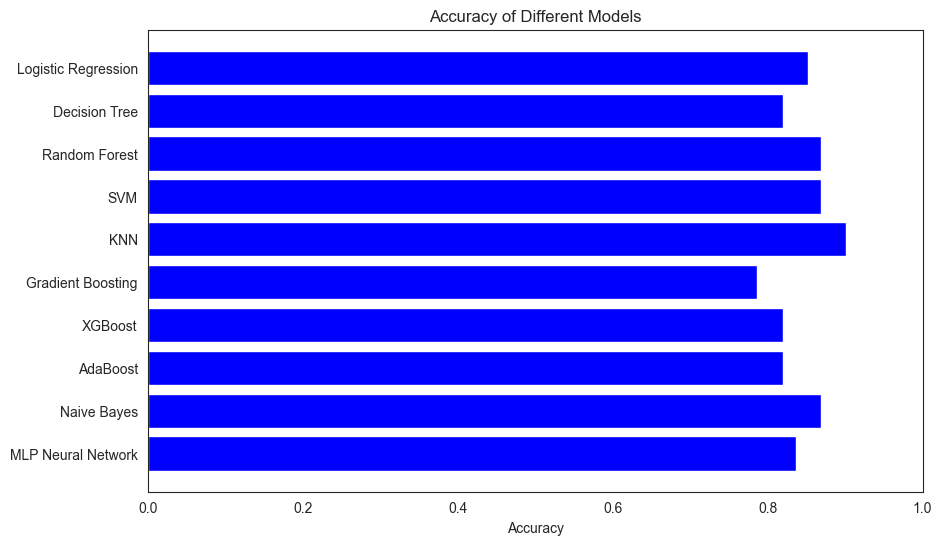

In [32]:
# Initialize the accuracies dictionary
accuracies = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies[name] = accuracy
    print(f"{name} Accuracy: {accuracy:.3f} \n", 40*'-')

# Create a bar plot for accuracies
plt.figure(figsize = (10, 6))
plt.barh(list(accuracies.keys()), list(accuracies.values()), color = 'blue')
plt.xlabel('Accuracy')
plt.title('Accuracy of Different Models')
plt.xlim(0, 1)
plt.gca().invert_yaxis() 
plt.show()

# FEATURE IMPORTANCE

**1. Feature Importance**

For tree-based models like Decision Tree, Random Forest, Gradient Boosting, and XGBoost, you can use the feature_importances_ attribute to get the importance of each feature.

In [33]:
'''
import pandas as pd

# Assuming you have a trained Random Forest model
importances = model.feature_importances_
feature_names = df.columns[:-1]  # Exclude the target column
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by = 'Importance', ascending  False)

print(feature_importance_df)
'''

"\nimport pandas as pd\n\n# Assuming you have a trained Random Forest model\nimportances = model.feature_importances_\nfeature_names = df.columns[:-1]  # Exclude the target column\nfeature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})\nfeature_importance_df = feature_importance_df.sort_values(by = 'Importance', ascending  False)\n\nprint(feature_importance_df)\n"

In [34]:
tree_based_models = ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'AdaBoost']
for name, model in models.items():
    if name in tree_based_models:
        model.fit(X_train, y_train)
        importances = model.feature_importances_
        feature_names = df.columns[:-1]  # Exclude the target column
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
        feature_importance_df = feature_importance_df.sort_values(by = 'Importance', ascending = False)
        print(f"{name} Feature Importance:\n", feature_importance_df)

Decision Tree Feature Importance:
      Feature  Importance
2         cp    0.225263
11       caa    0.133084
9    oldpeak    0.111877
0        age    0.109239
4       chol    0.076986
8       exng    0.075421
3     trtbps    0.072832
7   thalachh    0.061768
1        sex    0.041015
10       slp    0.039962
12     thall    0.036456
6    restecg    0.016097
5        fbs    0.000000
Random Forest Feature Importance:
      Feature  Importance
11       caa    0.133282
9    oldpeak    0.123808
2         cp    0.105023
12     thall    0.102163
0        age    0.094724
7   thalachh    0.094652
4       chol    0.080462
8       exng    0.077078
3     trtbps    0.075344
10       slp    0.047091
1        sex    0.037797
6    restecg    0.019198
5        fbs    0.009380
Gradient Boosting Feature Importance:
      Feature  Importance
11       caa    0.175155
2         cp    0.171475
12     thall    0.143273
9    oldpeak    0.116469
0        age    0.091597
10       slp    0.058723
4       chol    

**2. Coefficients**

For linear models like Logistic Regression, you can use the coefficients to understand the impact of each feature.

In [35]:
'''
coefficients = model.coef_[0]
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
feature_importance_df = feature_importance_df.sort_values(by = 'Coefficient', ascending = False)

print(feature_importance_df)
'''

"\ncoefficients = model.coef_[0]\nfeature_importance_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})\nfeature_importance_df = feature_importance_df.sort_values(by = 'Coefficient', ascending = False)\n\nprint(feature_importance_df)\n"

In [36]:
linear_models = ['Logistic Regression']
for name, model in models.items():
    if name in linear_models:
        model.fit(X_train, y_train)
        coefficients = model.coef_[0]
        feature_names = df.columns[:-1]  # Exclude the target column
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
        feature_importance_df = feature_importance_df.sort_values(by='Coefficient', ascending=False)
        print(f"{name} Coefficients:\n", feature_importance_df)

Logistic Regression Coefficients:
      Feature  Coefficient
2         cp     0.817904
10       slp     0.435302
7   thalachh     0.395131
6    restecg     0.284179
5        fbs     0.090312
0        age    -0.085591
4       chol    -0.174841
3     trtbps    -0.273307
8       exng    -0.517584
12     thall    -0.565659
9    oldpeak    -0.681396
1        sex    -0.783086
11       caa    -0.789955


**3. Permutation Importance**

Permutation importance can be used for any model. It works by shuffling the values of each feature and measuring the decrease in model performance.

In [37]:
'''
from sklearn.inspection import permutation_importance

result = permutation_importance(model, X_test, y_test, n_repeats = 10, random_state = 42)
perm_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': result.importances_mean})
perm_importance_df = perm_importance_df.sort_values(by = 'Importance', ascending = False)

print(perm_importance_df)
'''

"\nfrom sklearn.inspection import permutation_importance\n\nresult = permutation_importance(model, X_test, y_test, n_repeats = 10, random_state = 42)\nperm_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': result.importances_mean})\nperm_importance_df = perm_importance_df.sort_values(by = 'Importance', ascending = False)\n\nprint(perm_importance_df)\n"

In [38]:
from sklearn.inspection import permutation_importance

for name, model in models.items():
    model.fit(X_train, y_train)
    result = permutation_importance(model, X_test, y_test, n_repeats = 10, random_state = 42)
    feature_names = df.columns[:-1]  # Exclude the target column
    perm_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': result.importances_mean})
    perm_importance_df = perm_importance_df.sort_values(by = 'Importance', ascending = False)
    print(f"\n {name.upper()} Permutation Importance: \n", 50 * "-", "\n", perm_importance_df)


 LOGISTIC REGRESSION Permutation Importance: 
 -------------------------------------------------- 
      Feature    Importance
2         cp  5.081967e-02
1        sex  3.934426e-02
9    oldpeak  2.622951e-02
12     thall  2.131148e-02
11       caa  1.967213e-02
7   thalachh  1.967213e-02
3     trtbps  1.639344e-03
8       exng -2.220446e-17
0        age -3.330669e-17
4       chol -4.918033e-03
5        fbs -6.557377e-03
6    restecg -8.196721e-03
10       slp -9.836066e-03

 DECISION TREE Permutation Importance: 
 -------------------------------------------------- 
      Feature  Importance
0        age    0.104918
2         cp    0.104918
9    oldpeak    0.085246
11       caa    0.078689
12     thall    0.059016
4       chol    0.057377
10       slp    0.024590
3     trtbps    0.014754
7   thalachh    0.013115
1        sex    0.008197
6    restecg    0.006557
5        fbs    0.000000
8       exng   -0.011475

 RANDOM FOREST Permutation Importance: 
 ----------------------------------

**4. SHAP Values**

SHAP (SHapley Additive exPlanations) values provide a unified measure of feature importance for any model.

In [39]:
# pip install shap

In [40]:
# pip install tensorflow

In [41]:
'''
import shap

explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test, feature_names = feature_names)
'''

'\nimport shap\n\nexplainer = shap.Explainer(model, X_train)\nshap_values = explainer(X_test)\nshap.summary_plot(shap_values, X_test, feature_names = feature_names)\n'

LOGISTIC REGRESSION SHAP Summary Plot 
 --------------------------------------------------


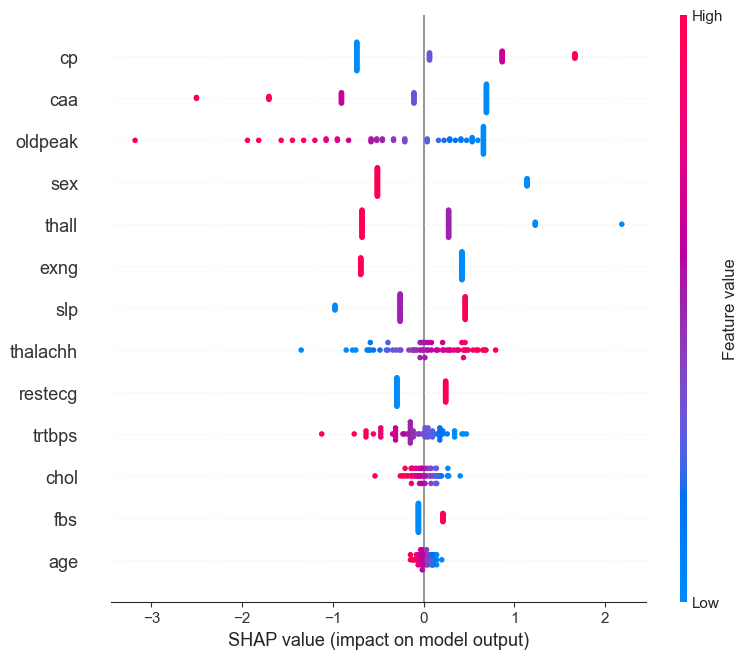

DECISION TREE SHAP Summary Plot 
 --------------------------------------------------
Refer to Permutation Importance for analysis. 

RANDOM FOREST SHAP Summary Plot 
 --------------------------------------------------
Refer to Permutation Importance for analysis. 



  0%|          | 0/61 [00:00<?, ?it/s]

SVM SHAP Summary Plot 
 --------------------------------------------------


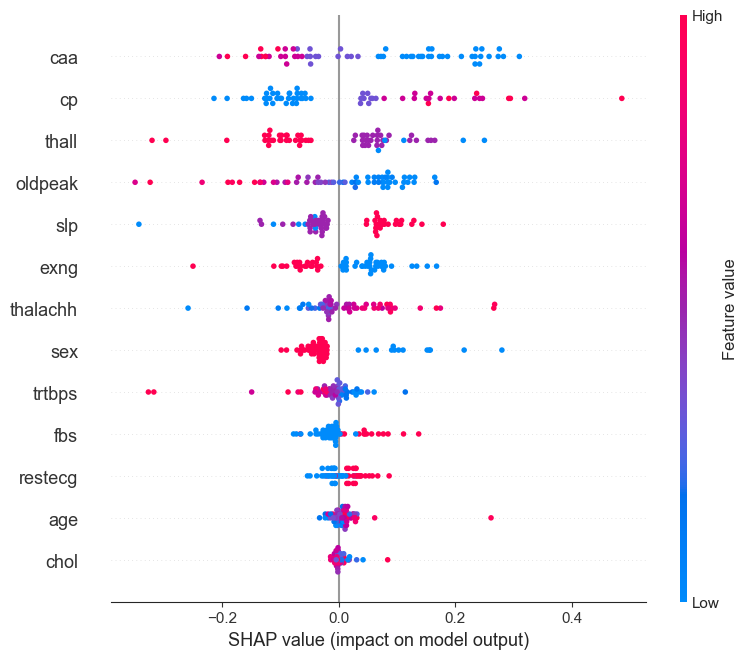

  0%|          | 0/61 [00:00<?, ?it/s]

KNN SHAP Summary Plot 
 --------------------------------------------------


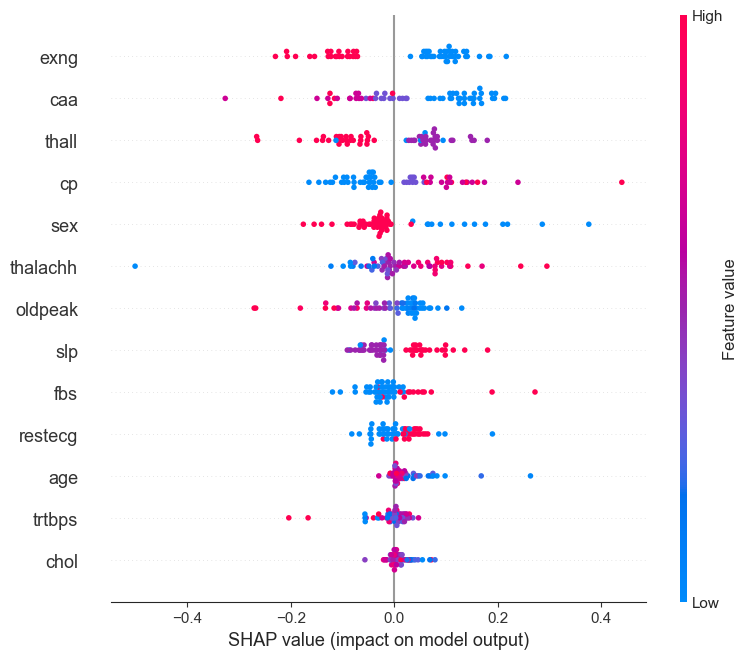

GRADIENT BOOSTING SHAP Summary Plot 
 --------------------------------------------------


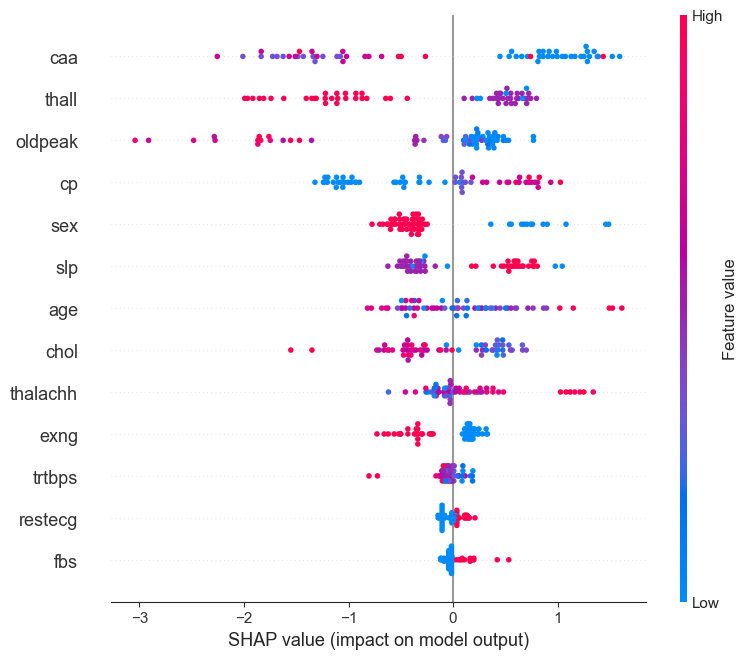

XGBOOST SHAP Summary Plot 
 --------------------------------------------------


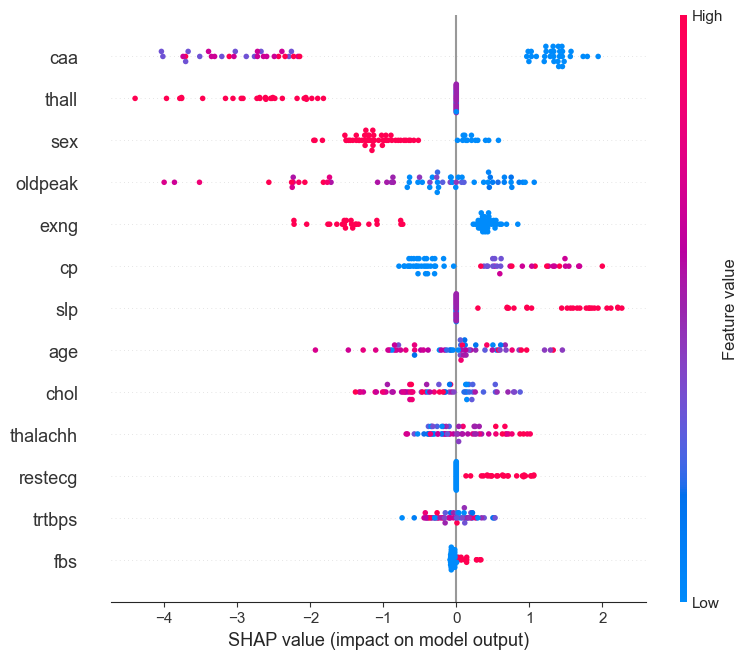

  0%|          | 0/61 [00:00<?, ?it/s]

ADABOOST SHAP Summary Plot 
 --------------------------------------------------


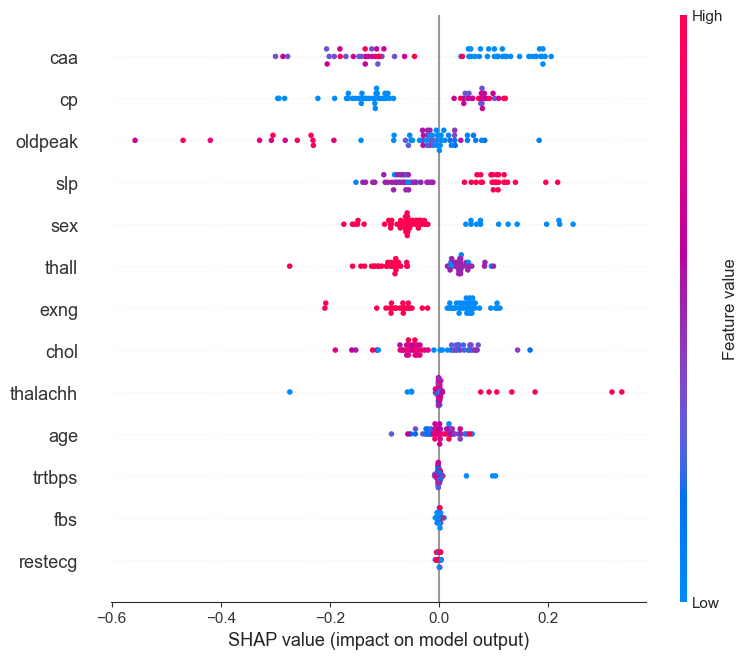

  0%|          | 0/61 [00:00<?, ?it/s]

NAIVE BAYES SHAP Summary Plot 
 --------------------------------------------------


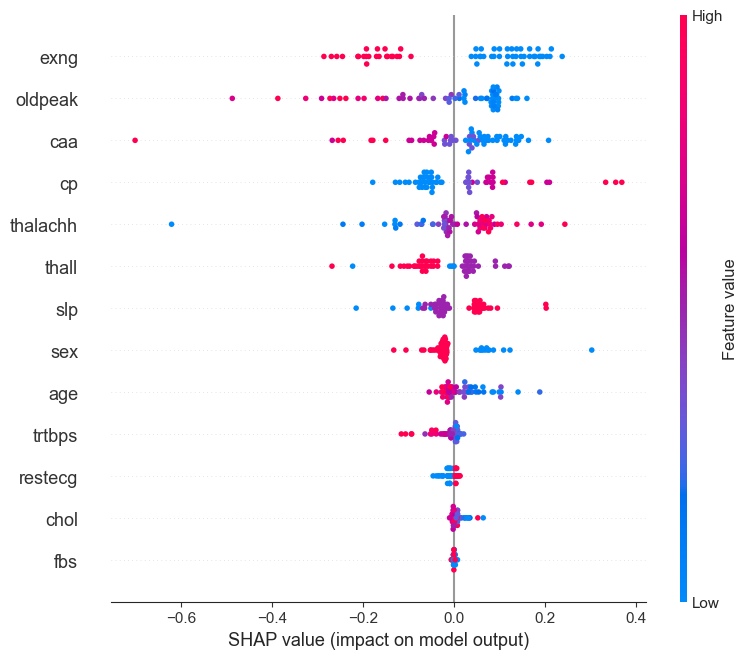

  0%|          | 0/61 [00:00<?, ?it/s]

MLP NEURAL NETWORK SHAP Summary Plot 
 --------------------------------------------------


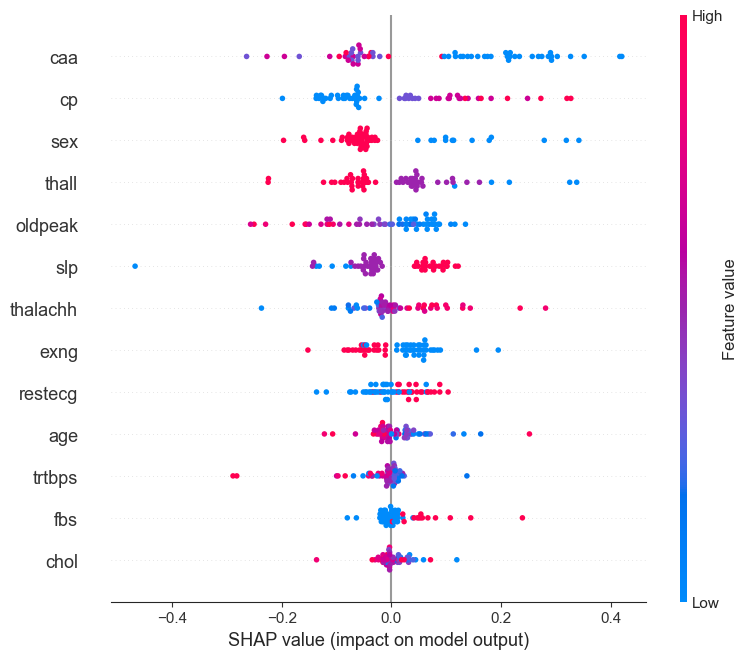

In [46]:
import shap

# Summarize the background data using k-means clustering
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 10, random_state = 42).fit(X_train)
background = kmeans.cluster_centers_

for name, model in models.items():
    model.fit(X_train, y_train)

    if name in ['Decision Tree', 'Random Forest']:
        print(f"{name.upper()} SHAP Summary Plot \n", 50 * "-")
        print(f"Refer to Permutation Importance for analysis. \n")
    else:
        if name in ['Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost']:
            explainer = shap.TreeExplainer(model, background, feature_perturbation = 'interventional')
            shap_values = explainer(X_test, check_additivity = False)  # Disable additivity check
        
        elif name == 'Logistic Regression':
            explainer = shap.LinearExplainer(model, background)
            shap_values = explainer(X_test)
        
        elif name in ['SVM', 'KNN', 'AdaBoost', 'Naive Bayes', 'MLP Neural Network']:
            explainer = shap.KernelExplainer(model.predict, background)
            shap_values = explainer.shap_values(X_test)
        
        else:
            explainer = shap.Explainer(model, background)
            shap_values = explainer(X_test)
        

        feature_names = df.columns[:-1]  # Exclude the target column
        
        print(f"{name.upper()} SHAP Summary Plot \n", 50 * "-")
        shap.summary_plot(shap_values, X_test, feature_names = feature_names)

**5. LIME**

LIME (Local Interpretable Model-agnostic Explanations) can be used to explain individual predictions.

In [43]:
'''
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names = feature_names, class_names = ['0', '1'], mode = 'classification')
i = 0  # Index of the instance to explain
exp = explainer.explain_instance(X_test.values[i], model.predict_proba, num_features = 13)
exp.show_in_notebook(show_table = True)
'''

"\nimport lime\nimport lime.lime_tabular\n\nexplainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names = feature_names, class_names = ['0', '1'], mode = 'classification')\ni = 0  # Index of the instance to explain\nexp = explainer.explain_instance(X_test.values[i], model.predict_proba, num_features = 13)\nexp.show_in_notebook(show_table = True)\n"

In [44]:
# pip install lime

In [45]:
import lime
import lime.lime_tabular

for name, model in models.items():
    model.fit(X_train, y_train)
    explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names = feature_names, class_names = ['0', '1'], mode = 'classification')
    i = 0  # Index of the instance to explain
    exp = explainer.explain_instance(X_test[i], model.predict_proba, num_features = 13)
    print(f"{name} LIME Explanation for instance {i}:")
    exp.show_in_notebook(show_table = True)

Logistic Regression LIME Explanation for instance 0:


Decision Tree LIME Explanation for instance 0:


Random Forest LIME Explanation for instance 0:


SVM LIME Explanation for instance 0:


KNN LIME Explanation for instance 0:


Gradient Boosting LIME Explanation for instance 0:


XGBoost LIME Explanation for instance 0:


AdaBoost LIME Explanation for instance 0:


Naive Bayes LIME Explanation for instance 0:


MLP Neural Network LIME Explanation for instance 0:


# CONCLUSIONS

1. **K-Nearest Neighbors (KNN)** achieved the highest accuracy of **0.90**. 
KNN performed well likely because it is a non-parametric method that makes few assumptions about the data distribution. It works well with smaller datasets and can capture complex relationships between features and the target variable.

2. **Random Forest** and **Support Vector Machine (SVM)** both achieved an accuracy of **0.87**.
     - **Random Forest**: This model benefits from ensemble learning, combining multiple decision trees to reduce overfitting and improve generalization. It can handle both numerical and categorical data effectively.
     - **SVM**: SVM is effective in high-dimensional spaces and works well with clear margin of separation. It is robust to overfitting, especially in high-dimensional space.

3. **Naive Bayes** also performed well with an accuracy of **0.87**.
Naive Bayes assumes independence between features, which might be a reasonable approximation for this dataset. It is also very efficient and works well with small datasets.

4. **Logistic Regression** and **MLP Neural Network** had accuracies of **0.85** and **0.84**, respectively.
     - **Logistic Regression**: This model is simple and interpretable, and it works well when the relationship between the features and the target is approximately linear.
     - **MLP Neural Network**: This model can capture non-linear relationships and interactions between features, but it may require more data and tuning to achieve higher performance.

5. **Decision Tree**, **XGBoost**, and **AdaBoost** all had accuracies of **0.82**.
     - **Decision Tree**: While interpretable, decision trees can overfit to the training data, especially with small datasets.
     - **XGBoost**: This model is powerful and can handle complex relationships, but it may require careful tuning and more data to perform optimally.
     - **AdaBoost**: This model combines weak learners to create a strong learner, but it can be sensitive to noisy data and outliers.

6. **Gradient Boosting** had the lowest accuracy of **0.79**.
Gradient Boosting can be prone to overfitting, especially with small datasets. It also requires careful tuning of hyperparameters to achieve optimal performance.



# Improvement Points

1. **Feature Engineering**: Consider creating new features or transforming existing ones to capture more information from the data. For example, you could create interaction terms or polynomial features.

2. **Hyperparameter Tuning**: Use techniques like Grid Search or Random Search to find the optimal hyperparameters for each model. This can significantly improve model performance.

3. **Ensemble Methods**: Combine multiple models to create an ensemble model. Techniques like stacking, bagging, or boosting can help improve overall performance.

4. **Cross-Validation**: Ensure you are using cross-validation to evaluate your models. This helps in getting a more reliable estimate of model performance.

5. **Data Augmentation**: If possible, augment your dataset to create more training examples. This can help improve model generalization.

6. **Regularization**: For models like Logistic Regression and SVM, consider adding regularization to prevent overfitting.

7. **Model Interpretability**: Use techniques like SHAP (SHapley Additive exPlanations) or LIME (Local Interpretable Model-agnostic Explanations) to understand which features are most important for your models' predictions.